In [14]:
import os
from pathlib import Path
import copy
import numpy as np
import torch

In [15]:
from pcdet.config import cfg, cfg_from_yaml_file
from pcdet.models import build_network, load_data_to_gpu
from pcdet.datasets import build_dataloader
from pcdet.utils import common_utils
import random

import math
from dataclasses import dataclass
from typing import Dict, List, Optional, Tuple

import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio

import torch.nn.functional as F

from collections import defaultdict

In [16]:
# import sys
# for k in list(sys.modules.keys()):
#     if k.startswith("pcdet"):
#         del sys.modules[k]
# sys.path = [p for p in sys.path if "OpenPCDet" not in p]
# sys.path.insert(0, PTT_PATH)

# import pcdet
# print("Now using:", pcdet.__file__)

from pcdet.config import cfg, cfg_from_yaml_file
from pcdet.datasets import build_dataloader
from pcdet.models import build_network, load_data_to_gpu
from pcdet.utils import common_utils

In [17]:
from pcdet.config import cfg, cfg_from_yaml_file
cfg.clear()


CFG_FILE = 'tools/cfgs/waymo_models/ptt_32frames.yaml' 
CKPT = 'output/cfgs/waymo_models/default/checkpoint_epoch_6.pth'  # <- put your ckpt here

cfg_from_yaml_file(CFG_FILE, cfg)
cfg.TAG = Path(CFG_FILE).stem
cfg.EXP_GROUP_PATH = 'centerpoint_waymo_demo'

import os
# cfg.DATA_CONFIG.DATA_PATH = os.path.join(OPENPCDET_PATH, 'data', 'waymo')

logger = common_utils.create_logger()
logger.info(f'Loaded cfg from {CFG_FILE}')


dataset, test_loader, _ = build_dataloader(
    dataset_cfg=cfg.DATA_CONFIG,
    class_names=cfg.CLASS_NAMES,
    batch_size=1,
    dist=False,
    workers=4,
    logger=logger,
    training=False
)

len_test = len(dataset)
logger.info(f'Test set length: {len_test}')
model = build_network(
    model_cfg=cfg.MODEL,
    num_class=len(cfg.CLASS_NAMES),
    dataset=dataset
)

logger.info(f'Loading checkpoint from: {CKPT}')
model.load_params_from_file(filename=CKPT, logger=logger, to_cpu=False)
model.cuda()
model.eval()

data_iter = iter(test_loader)
batch_dict = next(data_iter)

load_data_to_gpu(batch_dict)



2026-04-10 16:19:09,015   INFO  Loaded cfg from tools/cfgs/waymo_models/ptt_32frames.yaml
2026-04-10 16:19:09,015   INFO  Loaded cfg from tools/cfgs/waymo_models/ptt_32frames.yaml
2026-04-10 16:19:09,019   INFO  Loading Waymo dataset
2026-04-10 16:19:09,019   INFO  Loading Waymo dataset
2026-04-10 16:19:10,757   INFO  Total skipped info 0
2026-04-10 16:19:10,757   INFO  Total skipped info 0
2026-04-10 16:19:10,758   INFO  Total samples for Waymo dataset: 38597
2026-04-10 16:19:10,758   INFO  Total samples for Waymo dataset: 38597
2026-04-10 16:19:10,759   INFO  Loading and reorganizing pred_boxes to dict from path: /storage/project/r-gchou3-0/spanse30/OpenPCDet/output/cfgs/custom_models/centerpoint_multiframe_waymo/default/eval/epoch_36/val/default/result_fixed.pkl
2026-04-10 16:19:10,759   INFO  Loading and reorganizing pred_boxes to dict from path: /storage/project/r-gchou3-0/spanse30/OpenPCDet/output/cfgs/custom_models/centerpoint_multiframe_waymo/default/eval/epoch_36/val/default/r

In [18]:
dataset[0]['roi_boxes'].shape

(32, 88, 9)

In [19]:
# windows_frames['segment-10203656353524179475_7625_000_7645_000_with_camera_labels']

In [20]:
# segment_datasets['segment-10203656353524179475_7625_000_7645_000_with_camera_labels'][0].keys()

In [21]:
import pickle as pkl
from pcdet.ops.iou3d_nms import iou3d_nms_utils


ordered_segments = [info['point_cloud']['lidar_sequence'] for info in dataset.infos]
ordered_segments = list(dict.fromkeys(ordered_segments))  # remove duplicates while preserving order


pred_dir = 'preds_final_msf8'
dataset_dir = 'datasets'

dataset_names = os.listdir(dataset_dir)
dataset_names = [name for name in dataset_names if 'closer' not in name and 'random' not in name]
pred_names = os.listdir(pred_dir)

pred_names
# unique_segment_names = dataset.seq_name_to_infos.keys()
# segment_preds = {}
# for segment_name in ordered_segments:
#     with open(f"{pred_dir}/{segment_name}_p.pkl", "rb") as f:
#         segment_preds[segment_name] = pkl.load(f)

['msf8_removal_10',
 'msf8_removal_40',
 'msf8_rel_fixed_medium',
 'msf8_removal_20',
 'msf8_rel_fixed_easy',
 'msf8_rel_fixed_hard',
 'msf8_global_medium',
 'msf8_removal_50',
 'msf8_global_easy',
 'msf8_removal_30',
 'msf8_removal_60',
 'msf8_global_hard']

In [9]:
# import pickle as pkl
# from pcdet.ops.iou3d_nms import iou3d_nms_utils
# ordered_segments = [info['point_cloud']['lidar_sequence'] for info in dataset.infos]
# ordered_segments = list(dict.fromkeys(ordered_segments))  # remove duplicates while preserving order

# pred_dir = 'preds_final'
# dataset_dir = 'datasets'

# dataset_names = os.listdir(dataset_dir)
# dataset_names = [name for name in dataset_names if 'closer' not in name and 'random' not in name]
# pred_names = os.listdir(pred_dir)
# pred_names = [name for name in pred_names if 'msf' not in name and 'random' not in name]

# asr_dir = 'asr'
# os.makedirs(asr_dir, exist_ok=True)

# pred_names

In [39]:
"""
need global asr for 
msf8 point injection (rel_fixed, global)
cp, cp4f, msf4, msf8, ptt32 point removal 
"""

'\nneed global asr for \nmsf8 point injection (rel_fixed, global)\ncp, cp4f, msf4, msf8, ptt32 point removal \n'

In [22]:
with open('asr/asr_nomsf.pkl', 'rb') as file:
    data = pkl.load(file)

In [41]:
'msf4_' + data[2]['name'].split('_', 1)[1]

'msf4_rel_fixed_easy'

In [42]:
# for item in data:
# #     tensor_list_vscores = item['scores_vehicle']
#     tensor_list_cscores = item['score_cyclist']
#     tensor_list_pscores = item['scores_pedestrian']
    
#     item['scores_vehicle'] = np.array([t.item() for t in tensor_list_vscores])
#     item['score_cyclist'] = np.array([t.item() for t in tensor_list_cscores])
#     item['scores_pedestrian'] = np.array([t.item() for t in tensor_list_pscores])
    # if item['name'].startswith('msf'):
    #     name = item['name']
    #     mode = name.split('_', 1)[1]
    #     new_name = 'msf4_'+ mode
    #     item['name'] = new_name
    
    # new_name = 'scores_cyclist'
    # item[new_name] = item.pop('score_cyclist')
    
        
    
    

In [43]:
# import pickle as pkl
# from pcdet.ops.iou3d_nms import iou3d_nms_utils
# ordered_segments = [info['point_cloud']['lidar_sequence'] for info in dataset.infos]
# ordered_segments = list(dict.fromkeys(ordered_segments))  # remove duplicates while preserving order

# pred_dir = 'preds_final_msf8'
# dataset_dir = 'datasets'

# dataset_names = os.listdir(dataset_dir)
# dataset_names = [name for name in dataset_names if 'closer' not in name and 'random' not in name and 'removal' not in name]
# pred_names = os.listdir(pred_dir)
# pred_names = [name for name in pred_names if 'removal' not in name]

# asr_dir = 'asr'
# os.makedirs(asr_dir, exist_ok=True)


In [44]:


# # dataset_names = os.listdir(dataset_dir)
# # pred_names = os.listdir(pred_dir)


# #outer loop: datasets
# # inside outer loop: get list of preds associated with dataset (ptt and msf)
# # inner loop: iterate through preds
# # get metrics dict
# # write to asr folder 
# asr_annos = []
# for pred in pred_names:
#     print(pred)
    
#     mode = pred.split('_', 1)[1]
#     asr_annos_det_mode = {}

#     asr_annos_det_mode['name'] = pred
#     segment_preds = {}
    
#     current_segment = None
#     seg_dataset = None
    
#     total_target_frames = 0
#     num_vehicle_fp = 0
#     num_ped_fp = 0
#     num_cyc_fp = 0
#     num_0_preds = 0

#     scores_fp_vehicles = []
#     scores_fp_ped = []
#     scores_fp_cyc = []
#     spoof_rc_survivability_vehicles = []
#     spoof_rc_survivability_ped = []
#     spoof_rc_survivability_cyc = []

#     segment_count = 0
    
#     segment_preds = {}
            
#     for segment_name in ordered_segments:
#         with open(f"{pred_dir}/{pred}/{segment_name}_p.pkl", "rb") as f:
#             segment_preds[segment_name] = pkl.load(f)
 

#     for info in dataset.infos:
#         frame_id = info['frame_id']
#         parts = frame_id.rsplit('_', 1)
#         segment = parts[0]
#         i_seg = int(parts[1])

#         if current_segment != segment:
#             segment_count += 1
#             # print(f"segment count = {segment_count}")

#             seg_dataset_file = f"{dataset_dir}/{mode}_d/{segment}_d.pkl"
#             # print(seg_dataset_file)
#             with open(seg_dataset_file, "rb") as f:
#                 seg_dataset = pkl.load(f)

#             current_segment = segment

#         assert frame_id == seg_dataset[i_seg]['frame_id']

#         frame = seg_dataset[i_seg]
       
#         frame_pred = segment_preds[segment][i_seg]
        
#         gt_spoof = frame['spoof_gt']
#         if gt_spoof is not None:
#             total_target_frames += 1
#             pred_boxes = frame_pred['boxes_lidar']

#             if pred_boxes.shape[0] == 0:
#                 num_0_preds += 1
#                 # print("0 preds")
#                 continue
#             gt_boxes = frame['gt_boxes']

#             scores = frame_pred['score']
#             labels = frame_pred['pred_labels']

#             pred = torch.tensor(pred_boxes[:, :7]).cuda().float()

#             gt = torch.tensor(gt_spoof[:7]).unsqueeze(0).cuda().float()

#             iou = iou3d_nms_utils.boxes_iou3d_gpu(pred, gt)
#             max_iou = iou.max().item()
#             idx = torch.argmax(iou).item()
#             spoof_score = scores[idx]
#             spoof_label = labels[idx]

#             n_spoof_r = frame['n_spoof_r']
#             n_spoof_k = frame['n_spoof_k']

#             if(max_iou >= 0.7 and spoof_label == 1):
#                 # print(frame_id)
#                 # print(max_iou, spoof_score)
#                 num_vehicle_fp += 1
#                 scores_fp_vehicles.append(spoof_score)
#                 spoof_rc_survivability_vehicles.append((n_spoof_r, n_spoof_k, n_spoof_k/n_spoof_r))
#             if(spoof_label == 2 and max_iou >= 0.5):
#                 num_ped_fp += 1
#                 scores_fp_ped.append(spoof_score)
#                 spoof_rc_survivability_ped.append((n_spoof_r, n_spoof_k, n_spoof_k/n_spoof_r))
#                 # print("spoof misclasified as pedestrian")
#             if(spoof_label == 3 and max_iou >= 0.5):
#                 num_cyc_fp +=1
#                 scores_fp_cyc.append(spoof_score)
#                 spoof_rc_survivability_cyc.append((n_spoof_r, n_spoof_k, n_spoof_k/n_spoof_r))
#                 # print("spoof misclassified as cyclist")
        

#     asr_annos_det_mode['asr_vehicle'] = num_vehicle_fp/total_target_frames
#     asr_annos_det_mode['asr_pedestrian'] = num_ped_fp/total_target_frames
#     asr_annos_det_mode['asr_cyclist'] = num_cyc_fp/total_target_frames
#     asr_annos_det_mode['zero_pred_rate'] = num_0_preds / total_target_frames
#     asr_annos_det_mode['scores_vehicle'] = np.array([t.item() for t in scores_fp_vehicles])
#     asr_annos_det_mode['scores_pedestrian'] = np.array([t.item() for t in scores_fp_ped])
#     asr_annos_det_mode['scores_cyclist'] = np.array([t.item() for t in scores_fp_cyc])
#     asr_annos_det_mode['spoof_surv_vehicle'] = spoof_rc_survivability_vehicles
#     asr_annos_det_mode['spoof_surv_pedestrian'] = spoof_rc_survivability_ped
#     asr_annos_det_mode['spoof_surv_cyclist'] = spoof_rc_survivability_cyc
#     asr_annos_det_mode['num_targets'] = total_target_frames
#     asr_annos.append(asr_annos_det_mode)
#     print(f"{pred}: {asr_annos_det_mode['asr_vehicle']}")




        
        
        
            
#     # print(num_vehicle_fp, num_ped_fp, num_cyc_fp, num_0_preds, total_target_frames)

#                 # print(f"{pred_dir}/{detector}/")
    

In [10]:
import pickle as pkl
from pcdet.ops.iou3d_nms import iou3d_nms_utils
ordered_segments = [info['point_cloud']['lidar_sequence'] for info in dataset.infos]
ordered_segments = list(dict.fromkeys(ordered_segments))  # remove duplicates while preserving order

pred_dirs = ['preds_final', 'preds_final_msf4', 'preds_final_msf8', 'preds_final_ptt']
dataset_dir = 'datasets'

dataset_names = os.listdir(dataset_dir)
dataset_names = [name for name in dataset_names if 'removal' in name]
pred_names = []
for dir_ in pred_dirs:
    detector_preds = os.listdir(dir_)
    if(dir_ == 'preds_final'):
        detector_preds = [name for name in detector_preds if 'removal' in name and name.startswith('cp_')]
    else:
        detector_preds = [name for name in detector_preds if 'removal' in name]
    print(detector_preds)
    pred_names.extend(detector_preds)
# print(pred_names)
# print(len(pred_names))
# pred_names = os.listdir(pred_dir)
# pred_names = [name for name in pred_names if 'removal' not in name]

['cp_removal_50', 'cp_removal_60', 'cp_removal_30', 'cp_removal_20', 'cp_removal_10', 'cp_removal_40']
['msf4_removal_10', 'msf4_removal_20', 'msf4_removal_40', 'msf4_removal_30', 'msf4_removal_60', 'msf4_removal_50']
['msf8_removal_10', 'msf8_removal_40', 'msf8_removal_20', 'msf8_removal_50', 'msf8_removal_30', 'msf8_removal_60']
['ptt_removal_20', 'ptt_removal_60', 'ptt_removal_30', 'ptt_removal_10', 'ptt_removal_40', 'ptt_removal_50']


In [11]:
dataset_names

['removal_40',
 'removal_20',
 'removal_50',
 'removal_10',
 'removal_30',
 'removal_60']

In [12]:
import numpy as np

def wrap_to_pi(a):
    return (a + np.pi) % (2 * np.pi) - np.pi

def in_azimuth_wedge(gt_boxes, az_center, az_width):
    centers = gt_boxes[:, :3]
    x, y = centers[:, 0], centers[:, 1]

    theta = np.arctan2(y, x)
    theta = wrap_to_pi(theta)

    delta = wrap_to_pi(theta - az_center)

    half_width = az_width / 2.0

    return np.abs(delta) <= half_width

In [13]:
# clean_preds_msf4_filepath = "/storage/project/r-gchou3-0/spanse30/MSF/output/cfgs/waymo_models/msf_4frames/default/eval/eval_with_train/epoch_6/val/result.pkl"
# clean_preds_msf8_filepath = "/storage/project/r-gchou3-0/spanse30/MSF/output/cfgs/waymo_models/msf_8frames/default/eval/eval_with_train/epoch_6/val/result.pkl"
# clean_preds_cp_filepath = "/storage/project/r-gchou3-0/spanse30/OpenPCDet/output/cfgs/custom_models/centerpoint_singleframe_waymo/default/eval/eval_with_train/epoch_30/val/result.pkl"
# clean_preds_cp4f_filepath = "/storage/project/r-gchou3-0/spanse30/OpenPCDet/output/cfgs/custom_models/centerpoint_multiframe_waymo/default/eval/epoch_36/val/default/result_fixed.pkl"
# clean_preds_ptt_filepath = "/storage/home/hcoda1/9/spanse30/scratch/PTT/output/storage/scratch1/9/spanse30/PTT/tools/cfgs/waymo_models/ptt_32frames/default/eval/eval_with_train/epoch_6/val/result.pkl"

clean_preds_filepaths = ["/storage/project/r-gchou3-0/spanse30/OpenPCDet/output/cfgs/custom_models/centerpoint_singleframe_waymo/default/eval/eval_with_train/epoch_30/val/result.pkl",
"/storage/project/r-gchou3-0/spanse30/OpenPCDet/output/cfgs/custom_models/centerpoint_multiframe_waymo/default/eval/epoch_36/val/default/result_fixed.pkl",
"/storage/project/r-gchou3-0/spanse30/MSF/output/cfgs/waymo_models/msf_4frames/default/eval/eval_with_train/epoch_6/val/result.pkl",
"/storage/project/r-gchou3-0/spanse30/MSF/output/cfgs/waymo_models/msf_8frames/default/eval/eval_with_train/epoch_6/val/result.pkl",
"/storage/home/hcoda1/9/spanse30/scratch/PTT/output/storage/scratch1/9/spanse30/PTT/tools/cfgs/waymo_models/ptt_32frames/default/eval/eval_with_train/epoch_6/val/result.pkl"]
clean_preds = {'cp':None,
               'cp4f':None,
               'msf4':None,
               'msf8':None,
               'ptt':None}
for path, detector in zip(clean_preds_filepaths, clean_preds.keys()):
    with open(path, "rb") as f:
        preds = pkl.load(f)
        
    #index using frame id
    clean_pred_map = {p['frame_id']: p for p in preds}
    clean_preds[detector] = clean_pred_map

### # # dataset_names = os.listdir(dataset_dir)
# pred_names = os.listdir(pred_dir)


#outer loop: datasets
# inside outer loop: get list of preds associated with dataset (ptt and msf)
# inner loop: iterate through preds
# get metrics dict
# write to asr folder 

import time
start = time.perf_counter()
asr_annos = []
for dataset_name in dataset_names:
    search_term = dataset_name
    # print(search_term)
    subset = [s for s in pred_names if search_term in s]
    subset.append(f"cp4f_{search_term}")
    
    order = {'cp4f': 0,'cp': 1,  'msf4': 2, 'msf8': 3,  'ptt': 4}

    subset = sorted(subset, key=lambda x: order[x.split('_')[0]])
    print(subset)
    
    dataset_annos_dir = 'annos/'+dataset_name
    print(dataset_annos_dir)
    
    
    for detector in subset:
        detector_name = detector.split('_', 1)[0]
        clean_preds_detector = clean_preds[detector_name]
        
        pred_dir =  'preds_final' if detector.startswith('cp_') else 'preds_final_' + detector.split('_', 1)[0]
        asr_annos_det_mode = {}
        asr_annos_det_mode['name'] = detector
        
        segment_preds = {}
        segment_annos = {}
        # print(pred_dir)
            
        if not detector.startswith('cp4f'):
            for segment_name in ordered_segments:
                with open(f"{pred_dir}/{detector}/{segment_name}_p.pkl", "rb") as f:
                    segment_preds[segment_name] = pkl.load(f)
        for segment_name in ordered_segments:
            with open(f"{dataset_annos_dir}/{segment_name}_a.pkl", "rb") as f:
                segment_annos[segment_name] = pkl.load(f)
        
        print(f"{pred_dir}/{detector}/")
       
        current_segment = None
        seg_dataset = None

        total_target_frames = 0
        num_0_preds = 0


        segment_count = 0
        scores_target_object = []
        scores_target_clean = []
        scores_collateral_objects = []
        scores_collateral_clean = []
        num_targets_hid = 0
        num_collateral_hid = 0
        total_collateral_boxes = 0
        
        per_frame_removal_fraction = []
        collateral_per_frame = []
        num_frames_collateral_hid = 0
        for info in dataset.infos:
            frame_id = info['frame_id']
            parts = frame_id.rsplit('_', 1)
            segment = parts[0]
            i_seg = int(parts[1])

            if current_segment != segment:
                segment_count += 1
                # print(f"segment count = {segment_count}")

                seg_dataset_file = f"{dataset_dir}/{dataset_name}/{segment}_d.pkl"
                # print(seg_dataset_file)
                with open(seg_dataset_file, "rb") as f:
                    seg_dataset = pkl.load(f)

                current_segment = segment
                
            assert frame_id == seg_dataset[i_seg]['frame_id']
    
            frame = seg_dataset[i_seg]
            frame_anno = segment_annos[current_segment]['spoof_annos'][i_seg]
            
            if not detector.startswith('cp4f'):
                frame_pred = segment_preds[segment][i_seg]
            else:
                frame_pred = {}
                frame_pred['boxes_lidar'] = frame['pred_boxes']
                frame_pred['score'] = frame['pred_scores']
                frame_pred['pred_labels'] = frame['pred_labels']

#             # print(frame.keys())

#             # print(frame_pred)
            frame_pred_clean = clean_preds_detector[frame_id]
            gt_spoof = frame['spoof_gt']
            if gt_spoof is not None and frame_anno['active_this_frame']:
                total_target_frames += 1
                pred_boxes = frame_pred['boxes_lidar']
                pred_boxes_clean = frame_pred_clean['boxes_lidar']
                gt_boxes = frame['gt_boxes']

                scores = frame_pred['score']
                scores_clean = frame_pred_clean['score']
                labels = frame_pred['pred_labels']
                
                clean_pred = torch.tensor(pred_boxes_clean[:, :7]).cuda().float()
                gt = torch.tensor(gt_spoof[:7]).unsqueeze(0).cuda().float()
                target_label = gt_spoof[-1]
                threshold = 0.7 if target_label == 1 else 0.5
                # detector makes 0 predictions on spoofed frame
                if pred_boxes.shape[0] == 0:
                    num_0_preds += 1
                    # print("0 preds")
                    
                    #there werent any objects in the first place
                    if(len(gt_boxes)==0):
                        continue
                        
                    #there were objects in the frame
                    else:
                        #detector failure even in clean case - this was not an instance of failure to detect any objects, it was a bug of the detector itself
                        if pred_boxes_clean.shape[0] == 0:
                            continue
                        # there were gt boxes in the frame, detector under spoofing didnt predict anything but detector clean did
                        else:
                            num_targets_hid += 1
                            scores_target_object.append(0)
                            
                            #clean object score 
                            iou = iou3d_nms_utils.boxes_iou3d_gpu(clean_pred, gt)
                            max_iou_clean = iou.max().item()
                            idx = torch.argmax(iou).item()
                            clean_score = scores_clean[idx]
                            if max_iou_clean >= threshold: scores_target_clean.append(clean_score)
                            else:scores_target_clean.append(0)
                            
                            
                            az_center = frame_anno['az_center_rad']
                            az_width = np.deg2rad(frame_anno['az_width_deg'])

                            gt_boxes_in_sector = gt_boxes[in_azimuth_wedge(gt_boxes, az_center, az_width)]

                            #do not double count the spoof gt, it alread has its own asr
                            mask_not_spoof = ~np.all(np.isclose(gt_boxes_in_sector, gt_spoof, atol=1e-6), axis=1)
                            gt_boxes_collateral = gt_boxes_in_sector[mask_not_spoof]
                            collateral_per_frame.append(len(gt_boxes_collateral))
                            # print(gt_boxes_collateral)
                            num_collateral_hid +=len(gt_boxes_collateral)
                            total_collateral_boxes +=len(gt_boxes_collateral)
                            num_collateral_hid_in_frame = 0 
                            
                            for collateral_box in gt_boxes_collateral:
                                #clean
                                target_label = collateral_box[-1]
                                threshold = 0.7 if target_label == 1 else 0.5
                                gt_collateral = torch.tensor(collateral_box[:7]).unsqueeze(0).cuda().float()
                                iou = iou3d_nms_utils.boxes_iou3d_gpu(clean_pred, gt_collateral)
                                max_iou_clean = iou.max().item()
                                idx = torch.argmax(iou).item()
                                clean_score = scores_clean[idx]
                                if max_iou_clean >= threshold: scores_collateral_clean.append(clean_score)
                                else:scores_collateral_clean.append(0)
                                
                                #spoof
                                num_collateral_hid_in_frame +=1
                                scores_collateral_objects.append(0)
                            num_frames_collateral_hid += 1 if num_collateral_hid_in_frame>0 else 0

                            removal_fraction = 0 if len(gt_boxes_collateral) == 0 else num_collateral_hid_in_frame / len(gt_boxes_collateral)
                            per_frame_removal_fraction.append(removal_fraction)
                    continue
                

                pred = torch.tensor(pred_boxes[:, :7]).cuda().float()                
                iou = iou3d_nms_utils.boxes_iou3d_gpu(pred, gt)
                max_iou = iou.max().item()
                idx = torch.argmax(iou).item()
                spoof_score = scores[idx]
                spoof_label = labels[idx]
                if(max_iou < threshold):
                    # print(frame_id)
                    # print(max_iou, spoof_score)
                    num_targets_hid += 1
                    # scores_fp_vehicles.append(spoof_score)
                    scores_target_object.append(0)
                    
                    
                else: 
                    # print(f"target box still detected with confidence {spoof_score}")
                    scores_target_object.append(spoof_score.item())
                    
                #now check the clean prediction
                iou = iou3d_nms_utils.boxes_iou3d_gpu(clean_pred, gt)
                max_iou_clean = iou.max().item()
                idx = torch.argmax(iou).item()
                clean_score = scores_clean[idx]
                if max_iou_clean >= threshold: scores_target_clean.append(clean_score)
                else:scores_target_clean.append(0)
                    
                #now process collateral targets
                az_center = frame_anno['az_center_rad']
                az_width = np.deg2rad(frame_anno['az_width_deg'])
                
                gt_boxes_in_sector = gt_boxes[in_azimuth_wedge(gt_boxes, az_center, az_width)]
                
                #do not double count the spoof gt, it alread has its own asr
                mask_not_spoof = ~np.all(np.isclose(gt_boxes_in_sector, gt_spoof, atol=1e-6), axis=1)
                gt_boxes_collateral = gt_boxes_in_sector[mask_not_spoof]
                # print(gt_boxes_collateral)
                
                collateral_per_frame.append(len(gt_boxes_collateral))
                num_collateral_hid_in_frame = 0
                for collateral_box in gt_boxes_collateral:
                    #update some sort of counter
                    total_collateral_boxes +=1
                    gt = torch.tensor(collateral_box[:7]).unsqueeze(0).cuda().float()
                    target_label = collateral_box[-1]
                    threshold = 0.7 if target_label == 1 else 0.5
                    iou = iou3d_nms_utils.boxes_iou3d_gpu(pred, gt)
                    max_iou = iou.max().item()
                    idx = torch.argmax(iou).item()
                    spoof_score = scores[idx]
                    spoof_label = labels[idx]
                    if(max_iou < threshold):
                        num_collateral_hid_in_frame+=1
                    # print(frame_id)
                    # print(max_iou, spoof_score)
                        num_collateral_hid += 1
                        # scores_fp_vehicles.append(spoof_score)
                        scores_collateral_objects.append(0)
                    else: 
                        # print(f"target box still detected with confidence {spoof_score}")
                        scores_collateral_objects.append(spoof_score.item())
                        
                    #now check the clean collateral
                    gt_collateral = torch.tensor(collateral_box[:7]).unsqueeze(0).cuda().float()
                    iou = iou3d_nms_utils.boxes_iou3d_gpu(clean_pred, gt_collateral)
                    max_iou_clean = iou.max().item()
                    idx = torch.argmax(iou).item()
                    clean_score = scores_clean[idx]
                    if max_iou_clean >= threshold: scores_collateral_clean.append(clean_score)
                    else:scores_collateral_clean.append(0)
                    
                num_frames_collateral_hid += 1 if num_collateral_hid_in_frame>0 else 0
                
                removal_fraction = 0 if len(gt_boxes_collateral) == 0 else num_collateral_hid_in_frame / len(gt_boxes_collateral)
                per_frame_removal_fraction.append(removal_fraction)
                    
                # break
                
        collateral_removal_rate = 0 if total_collateral_boxes == 0 else num_collateral_hid / total_collateral_boxes
        sector_failure_rate = num_frames_collateral_hid / total_target_frames
        per_frame_removal_fraction_avg = np.mean(per_frame_removal_fraction)
        target_asr = num_targets_hid / total_target_frames
        
        asr_annos_det_mode['crr'] = collateral_removal_rate
        asr_annos_det_mode['sfr'] = sector_failure_rate
        asr_annos_det_mode['mean_pfr'] = per_frame_removal_fraction_avg
        asr_annos_det_mode['pfr'] = per_frame_removal_fraction
        asr_annos_det_mode['target_asr'] = target_asr
        asr_annos_det_mode['n_targets'] = total_target_frames
        asr_annos_det_mode['n_collateral'] = total_collateral_boxes
        asr_annos_det_mode['n_frames_collateral_hid'] = num_frames_collateral_hid # number of frames where at least one collateral is hid
        asr_annos_det_mode['scores_collateral'] = scores_collateral_objects
        asr_annos_det_mode['scores_target'] = scores_target_object
        asr_annos_det_mode['scores_collateral_clean'] = scores_collateral_clean
        asr_annos_det_mode['scores_target_clean'] = scores_target_clean
        asr_annos_det_mode['collateral_per_frame'] = collateral_per_frame
        
        #also write total collateral boxes, total target frames
        print(f"CRR: {collateral_removal_rate}")
        print(f"sector failure rate: {sector_failure_rate}")
        print(f"average per frame removal fraction: {per_frame_removal_fraction_avg}")
        print(f"target asr: {target_asr}")
        # print(num_0_preds)
        asr_annos.append(asr_annos_det_mode)
        
        # scores_float = [score.item() if torch.is_tensor(score) else score for score in scores_target_object]
        # print(len(scores_target_object))
        # break
       

with open(f"asr/asr_pr.pkl", "wb") as f:
    pkl.dump(asr_annos, f)
        


        
        
        
            
    # print(num_vehicle_fp, num_ped_fp, num_cyc_fp, num_0_preds, total_target_frames)

                # print(f"{pred_dir}/{detector}/")
end = time.perf_counter()
print(f"Elapsed time: {end - start:.6f} seconds")
    

['cp4f_removal_40', 'cp_removal_40', 'msf4_removal_40', 'msf8_removal_40', 'ptt_removal_40']
annos/removal_40
preds_final_cp4f/cp4f_removal_40/


/tmp/ipykernel_877819/4072662057.py:207: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  pred = torch.tensor(pred_boxes[:, :7]).cuda().float()
/storage/scratch1/9/spanse30/PTT/pcdet/ops/iou3d_nms/iou3d_nms_utils.py:66: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:83.)
  overlaps_bev = torch.cuda.FloatTensor(torch.Size((boxes_a.shape[0], boxes_b.shape[0]))).zero_()  # (N, M)


CRR: 0.4556511631796364
sector failure rate: 0.8883341759352882
average per frame removal fraction: 0.4156679815271524
target asr: 0.597257330637007
Elapsed time: 616.912845 seconds


In [ ]:
segment_annos['segment-10203656353524179475_7625_000_7645_000_with_camera_labels']['spoof_annos'][32]['active_this_frame']

In [ ]:
segment_annos['segment-10203656353524179475_7625_000_7645_000_with_camera_labels']['spoof_annos'][32]

In [ ]:
scores_float = [score.item() if torch.is_tensor(score) else score for score in scores_target_object]
print(np.count_nonzero(np.array(scores_float)))
print(len(scores_target_object))

In [ ]:
print(total_target_frames)

In [ ]:
np.rad2deg(-2.7354988795961908)

In [ ]:
# ### # # dataset_names = os.listdir(dataset_dir)
# # pred_names = os.listdir(pred_dir)


# #outer loop: datasets
# # inside outer loop: get list of preds associated with dataset (ptt and msf)
# # inner loop: iterate through preds
# # get metrics dict
# # write to asr folder 
# asr_annos = []
# for dataset_name in dataset_names:
#     search_term = dataset_name[:-2]
#     subset = [s for s in pred_names if search_term in s]
#     subset.append(f"cp4f_{search_term}")
#     order = {'cp4f': 0,'cp': 1,  'msf4': 2, 'msf8': 3,  'ptt': 4}

#     subset = sorted(subset, key=lambda x: order[x.split('_')[0]])
#     print(subset)
#     for detector in subset:
#         print(detector)
#         asr_annos_det_mode = {}
#         asr_annos_det_mode['name'] = detector
        
#         segment_preds = {}
            
#         if not detector.startswith('cp4f'):
#             for segment_name in ordered_segments:
#                 with open(f"{pred_dir}/{detector}/{segment_name}_p.pkl", "rb") as f:
#                     segment_preds[segment_name] = pkl.load(f)
#         # print(f"{pred_dir}/{detector}/")
       
#         current_segment = None
#         seg_dataset = None

#         total_target_frames = 0
#         num_vehicle_fp = 0
#         num_ped_fp = 0
#         num_cyc_fp = 0
#         num_0_preds = 0

#         scores_fp_vehicles = []
#         scores_fp_ped = []
#         scores_fp_cyc = []
#         spoof_rc_survivability_vehicles = []
#         spoof_rc_survivability_ped = []
#         spoof_rc_survivability_cyc = []

#         segment_count = 0
        
#         for info in dataset.infos:
#             frame_id = info['frame_id']
#             parts = frame_id.rsplit('_', 1)
#             segment = parts[0]
#             i_seg = int(parts[1])

#             if current_segment != segment:
#                 segment_count += 1
#                 # print(f"segment count = {segment_count}")

#                 seg_dataset_file = f"{dataset_dir}/{dataset_name}/{segment}_d.pkl"
#                 # print(seg_dataset_file)
#                 with open(seg_dataset_file, "rb") as f:
#                     seg_dataset = pkl.load(f)

#                 current_segment = segment
                
#             assert frame_id == seg_dataset[i_seg]['frame_id']
    
#             frame = seg_dataset[i_seg]
#             if not detector.startswith('cp4f'):
#                 frame_pred = segment_preds[segment][i_seg]
#             else:
#                 frame_pred = {}
#                 frame_pred['boxes_lidar'] = frame['pred_boxes']
#                 frame_pred['score'] = frame['pred_scores']
#                 frame_pred['pred_labels'] = frame['pred_labels']

#             # print(frame.keys())

#             # print(frame_pred)

#             gt_spoof = frame['spoof_gt']
#             if gt_spoof is not None:
#                 total_target_frames += 1
#                 pred_boxes = frame_pred['boxes_lidar']

#                 if pred_boxes.shape[0] == 0:
#                     num_0_preds += 1
#                     # print("0 preds")
#                     continue
#                 gt_boxes = frame['gt_boxes']

#                 scores = frame_pred['score']
#                 labels = frame_pred['pred_labels']

#                 pred = torch.tensor(pred_boxes[:, :7]).cuda().float()

#                 gt = torch.tensor(gt_spoof[:7]).unsqueeze(0).cuda().float()

#                 iou = iou3d_nms_utils.boxes_iou3d_gpu(pred, gt)
#                 max_iou = iou.max().item()
#                 idx = torch.argmax(iou).item()
#                 spoof_score = scores[idx]
#                 spoof_label = labels[idx]

#                 n_spoof_r = frame['n_spoof_r']
#                 n_spoof_k = frame['n_spoof_k']

#                 if(max_iou >= 0.7 and spoof_label == 1):
#                     # print(frame_id)
#                     # print(max_iou, spoof_score)
#                     num_vehicle_fp += 1
#                     scores_fp_vehicles.append(spoof_score)
#                     spoof_rc_survivability_vehicles.append((n_spoof_r, n_spoof_k, n_spoof_k/n_spoof_r))
#                 if(spoof_label == 2 and max_iou >= 0.5):
#                     num_ped_fp += 1
#                     scores_fp_ped.append(spoof_score)
#                     spoof_rc_survivability_ped.append((n_spoof_r, n_spoof_k, n_spoof_k/n_spoof_r))
#                     # print("spoof misclasified as pedestrian")
#                 if(spoof_label == 3 and max_iou >= 0.5):
#                     num_cyc_fp +=1
#                     scores_fp_cyc.append(spoof_score)
#                     spoof_rc_survivability_cyc.append((n_spoof_r, n_spoof_k, n_spoof_k/n_spoof_r))
#                     # print("spoof misclassified as cyclist")
#         asr_annos_det_mode['asr_vehicle'] = num_vehicle_fp/total_target_frames
#         asr_annos_det_mode['asr_pedestrian'] = num_ped_fp/total_target_frames
#         asr_annos_det_mode['asr_cyclist'] = num_cyc_fp/total_target_frames
#         asr_annos_det_mode['zero_pred_rate'] = num_0_preds / total_target_frames
#         asr_annos_det_mode['scores_vehicle'] = scores_fp_vehicles
#         asr_annos_det_mode['scores_pedestrian'] = scores_fp_ped
#         asr_annos_det_mode['score_cyclist'] = scores_fp_cyc
#         asr_annos_det_mode['spoof_surv_vehicle'] = spoof_rc_survivability_vehicles
#         asr_annos_det_mode['spoof_surv_pedestrian'] = spoof_rc_survivability_ped
#         asr_annos_det_mode['spoof_surv_cyclist'] = spoof_rc_survivability_cyc
#         asr_annos_det_mode['num_targets'] = total_target_frames
#         asr_annos.append(asr_annos_det_mode)
#         print(f"{detector}: {asr_annos_det_mode['asr_vehicle']}")

# with open(f"{asr_dir}/asr_nomsf.pkl", "wb") as f:
#     pkl.dump(asr_annos, f)
        


        
        
        
            
#     # print(num_vehicle_fp, num_ped_fp, num_cyc_fp, num_0_preds, total_target_frames)

#                 # print(f"{pred_dir}/{detector}/")
    

In [ ]:
with open(f"{asr_dir}/asr.pkl", "wb") as f:
    pkl.dump(asr_annos, f)

import pickle as pkl
import torch

with open("asr/asr_nomsf.pkl", "rb") as f:
    asr_annos = pkl.load(f)

def to_cpu_scalar(x):
    if isinstance(x, torch.Tensor):
        return x.detach().cpu().item()
    return x

for entry in asr_annos:
    if entry['name'].startswith('cp4f'):
        # convert score lists
        entry['scores_vehicle'] = [to_cpu_scalar(x) for x in entry['scores_vehicle']]
        entry['scores_pedestrian'] = [to_cpu_scalar(x) for x in entry['scores_pedestrian']]
        entry['score_cyclist'] = [to_cpu_scalar(x) for x in entry['score_cyclist']]

# save cleaned version
with open("asr/asr.pkl", "wb") as f:
    pkl.dump(asr_annos, f)

In [24]:
asr_annos[0]

{'name': 'cp4f_rel_fixed_easy',
 'asr_vehicle': 0.11669073212471255,
 'asr_pedestrian': 0.00021391518263008717,
 'asr_cyclist': 0.0014439274827530884,
 'zero_pred_rate': 0.0,
 'scores_vehicle': [tensor(0.7281, device='cuda:0'),
  tensor(0.7484, device='cuda:0'),
  tensor(0.7612, device='cuda:0'),
  tensor(0.8326, device='cuda:0'),
  tensor(0.8090, device='cuda:0'),
  tensor(0.7297, device='cuda:0'),
  tensor(0.7801, device='cuda:0'),
  tensor(0.7590, device='cuda:0'),
  tensor(0.7411, device='cuda:0'),
  tensor(0.7462, device='cuda:0'),
  tensor(0.7492, device='cuda:0'),
  tensor(0.7706, device='cuda:0'),
  tensor(0.7348, device='cuda:0'),
  tensor(0.7338, device='cuda:0'),
  tensor(0.7784, device='cuda:0'),
  tensor(0.7469, device='cuda:0'),
  tensor(0.8070, device='cuda:0'),
  tensor(0.7699, device='cuda:0'),
  tensor(0.8053, device='cuda:0'),
  tensor(0.7547, device='cuda:0'),
  tensor(0.7540, device='cuda:0'),
  tensor(0.7316, device='cuda:0'),
  tensor(0.7802, device='cuda:0'),
  

In [82]:
spoof_rc_survivability_vehicles

NameError: name 'spoof_rc_survivability_vehicles' is not defined

In [11]:
    with open(f"{dataset_dir}/{segment_name}_d.pkl", "rb") as f:
        segment_dataset[segment_name] = pkl.load(f)
infos = dataset.infos

len(segment_preds[ordered_segments[0]])



198

In [9]:
import time

In [10]:
import pickle as pkl



ordered_segments = [info['point_cloud']['lidar_sequence'] for info in dataset.infos]
ordered_segments = list(dict.fromkeys(ordered_segments))  # remove duplicates while preserving order


pred_dir = 'preds/ptt_rel_fixed_easy'

segment_preds = {}
unique_segment_names = dataset.seq_name_to_infos.keys()
for segment_name in unique_segment_names:
    with open(f"{pred_dir}/{segment_name}_p.pkl", "rb") as f:
        segment_preds[segment_name] = pkl.load(f)
infos = dataset.infos
det_annos = []

segment_frame_counters = {}

for info in infos:
    segment = info['point_cloud']['lidar_sequence']

    if segment not in segment_frame_counters:
        segment_frame_counters[segment] = 0

    idx = segment_frame_counters[segment]

    det_annos.append(segment_preds[segment][idx])

    segment_frame_counters[segment] += 1

for pred, info in zip(det_annos, dataset.infos):
    assert pred['frame_id'] == info['frame_id']


timing_annos_dir = 'annos/relative_position_fixed_easy_a'
segment_annos = {}
for segment_name in unique_segment_names:
    with open(f"{timing_annos_dir}/{segment_name}_a.pkl", "rb") as f:
        segment_annos[segment_name] = pkl.load(f)



In [84]:
len(dataset.infos)

18114

In [41]:
segment_preds['segment-10203656353524179475_7625_000_7645_000_with_camera_labels'][0]['frame_id']

'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_000'

In [81]:
timing = {
    'clean_hist_clean_obs':0,
    'clean_hist_pert_obs':1,
    'pert_hist_pert_obs':2,
    'pert_hist_clean_obs':3
}

target_frames= []
for segment in ordered_segments:
    timing_arr = np.array(segment_annos[segment]['timing_ptt'])

    selected_frame_indices = np.where(timing_arr == timing['pert_hist_pert_obs'])[0]
    
    segment_pred_list = segment_preds[segment]
    
    subset_frame_ids = [segment_pred_list[i]['frame_id'] for i in selected_frame_indices]
    target_frames+=subset_frame_ids
    

len(target_frames)

filtered_infos = []
filtered_annos = []

for info, pred in zip(dataset.infos, det_annos):
    if info['frame_id'] in target_frames:
        filtered_infos.append(info)
        filtered_annos.append(pred)
        
for pred, info in zip(filtered_annos, filtered_infos):
    assert pred['frame_id'] == info['frame_id']
        
original_infos = dataset.infos

dataset.infos = filtered_infos

assert(len(dataset.infos) == len(target_frames))

print("starting evaluation")
result_str, result_dict = dataset.evaluation(
    filtered_annos,
    cfg.CLASS_NAMES,
    eval_metric=cfg.MODEL.POST_PROCESSING.EVAL_METRIC
)

dataset.infos = original_infos

    

starting evaluation


2026-03-08 15:53:31.909397: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-03-08 15:53:32.762577: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


Start the waymo evaluation...
Number: (pd, 1385002) VS. (gt, 760444)
Level 1: 643280, Level2: 117164)
Instructions for updating:
Use `self.session()` or `self.cached_session()` instead.


2026-03-08 15:53:44.488607: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-03-08 15:53:44.501432: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:357] MLIR V1 optimization pass is not enabled
2026-03-08 15:53:44.723905: W tensorflow/c/c_api.cc:291] Operation '{name:'Const_22' id:340 op device:{requested: '', assigned: ''} def:{{{node Const_22}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [0] values: >]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or

KeyboardInterrupt: 

In [68]:
# target_frames

In [74]:
timing = {
    'clean_hist_clean_obs':0,
    'clean_hist_pert_obs':1,
    'pert_hist_pert_obs':2,
    'pert_hist_clean_obs':3
}

timing_arr = np.array(segment_annos['segment-10203656353524179475_7625_000_7645_000_with_camera_labels']['timing_ptt'])
selected_frame_indices = np.where(timing_arr == timing['pert_hist_pert_obs'])[0]

timing_arr


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3])

In [72]:
subset_frame_ids = [segment_preds['segment-10203656353524179475_7625_000_7645_000_with_camera_labels'][i]['frame_id'] for i in selected_frame_indices]

subset_frame_ids

['segment-10203656353524179475_7625_000_7645_000_with_camera_labels_033',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_034',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_035',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_036',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_037',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_038',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_039',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_040',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_041',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_042',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_043',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_044',
 'segment-10203656353524179475_7625_000_7645_000_with_camera_labels_045',
 'segment-10203656353524179475_7625_00

SyntaxError: unexpected EOF while parsing (2900199248.py, line 1)

In [ ]:
dataset[2]['roi_labels']

In [ ]:
dataset[0].keys()

In [29]:
# import torch
# from pcdet.ops.iou3d_nms import iou3d_nms_utils

# sum_ = 0
# count_score = 0
# count_iou = 0
# score_sum = 0

# for i in range(198):
#     frame = seg_dataset[i]
#     if(seg_dataset[i]['spoof_gt'] is not None):
#         pred_boxes = segment_preds_list[i]['boxes_lidar']
#         gt_boxes = dataset[i]['gt_boxes']
        
#         # gt_spoof = frame['spoof_gt']

#         pred = torch.tensor(pred_boxes[:, :7]).cuda().float()
#         # gt   = torch.tensor(gt_boxes[:, :7]).cuda().float()
#         gt = torch.tensor(gt_spoof[:7]).unsqueeze(0).cuda().float()
#         iou = iou3d_nms_utils.boxes_iou3d_gpu(pred, gt)
#         max_iou = iou.max().item()
#         idx = torch.argmax(iou)
        
#         sum_ += 1
#         if(iou[idx].item()  >= 0.7):
#             # print("reached")
#             count_iou +=1
#             count_score+=1
#             score_sum += frame['pred_scores'][idx].item()
        
#         print(i, idx.item(), iou[idx].item(), frame['pred_scores'][idx].item(), frame['pred_labels'][idx].item(), frame['n_spoof_k']/frame['n_spoof_r'], frame['n_spoof_k'])
# print(count_iou / sum_)
# print(score_sum / count_score)

32 2 0.3768404424190521 0.853108823299408 1 0.9441056910569106 929
33 2 0.4000653624534607 0.8563564419746399 1 0.9441056910569106 929
34 2 0.3400929868221283 0.8101819753646851 1 0.9441056910569106 929
35 4 0.578637421131134 0.8214564323425293 1 0.9441056910569106 929
36 2 0.17211727797985077 0.8294975757598877 1 0.9380081300813008 923
37 4 0.5129285454750061 0.782648503780365 1 0.9186991869918699 904
38 2 0.6249436140060425 0.8863546252250671 1 0.9471544715447154 932
39 3 0.31408706307411194 0.7847113013267517 1 0.9502032520325203 935
40 2 0.4385138154029846 0.8680834174156189 1 0.9471544715447154 932
41 2 0.15055762231349945 0.9125564098358154 1 0.9491869918699187 934
42 9 0.2424009144306183 0.3086232841014862 1 0.9369918699186992 922
43 8 0.06939541548490524 0.5306301712989807 2 0.8719512195121951 858
44 5 0.5060811638832092 0.6702768206596375 1 0.9258130081300813 911
45 0 0.3913218379020691 0.9032547473907471 1 0.9451219512195121 930
46 6 0.043268751353025436 0.7669876217842102 1 

In [21]:
import matplotlib.pyplot as plt
import numpy as np

def plot_bev_ptt(pts, pred_boxes, gt_spoof=None):

    plt.figure(figsize=(10,10))

    # scene points
    plt.scatter(pts[:,0], pts[:,1], s=0.2, alpha=0.3)

    def draw_box(box, color, lw=2):
        x, y, z, dx, dy, dz, yaw = box[:7]

        corners = np.array([
            [ dx/2,  dy/2],
            [ dx/2, -dy/2],
            [-dx/2, -dy/2],
            [-dx/2,  dy/2],
            [ dx/2,  dy/2]
        ])

        c, s = np.cos(yaw), np.sin(yaw)
        R = np.array([[c,-s],[s,c]])
        corners = corners @ R.T

        corners[:,0] += x
        corners[:,1] += y

        plt.plot(corners[:,0], corners[:,1], color=color, linewidth=lw)

    # predicted boxes
    for box in pred_boxes:
        draw_box(box, 'blue', lw=1)

    # spoof GT
    if gt_spoof is not None:
        draw_box(gt_spoof, 'red', lw=3)

    plt.axis('equal')
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title("BEV: scene points / PTT predictions / spoof GT")
    plt.show()

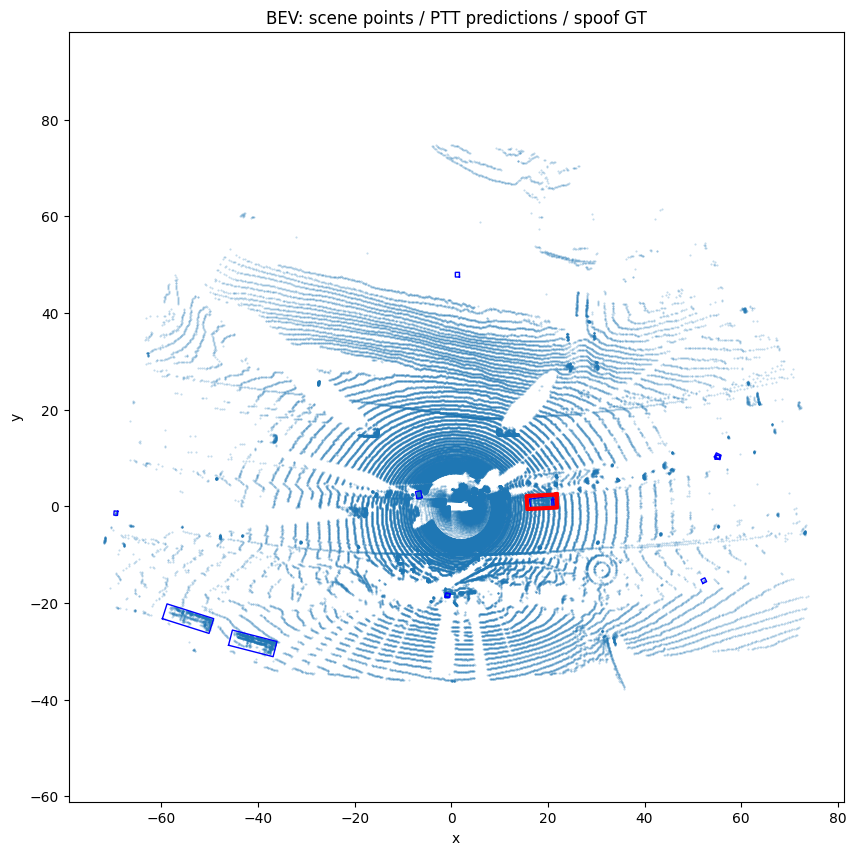

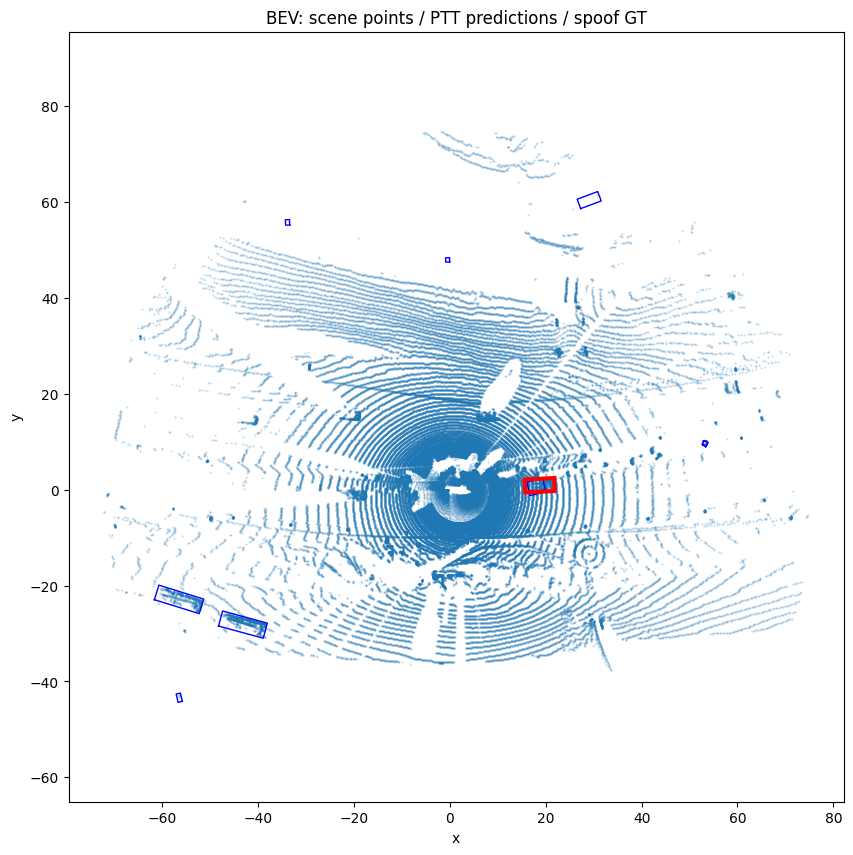

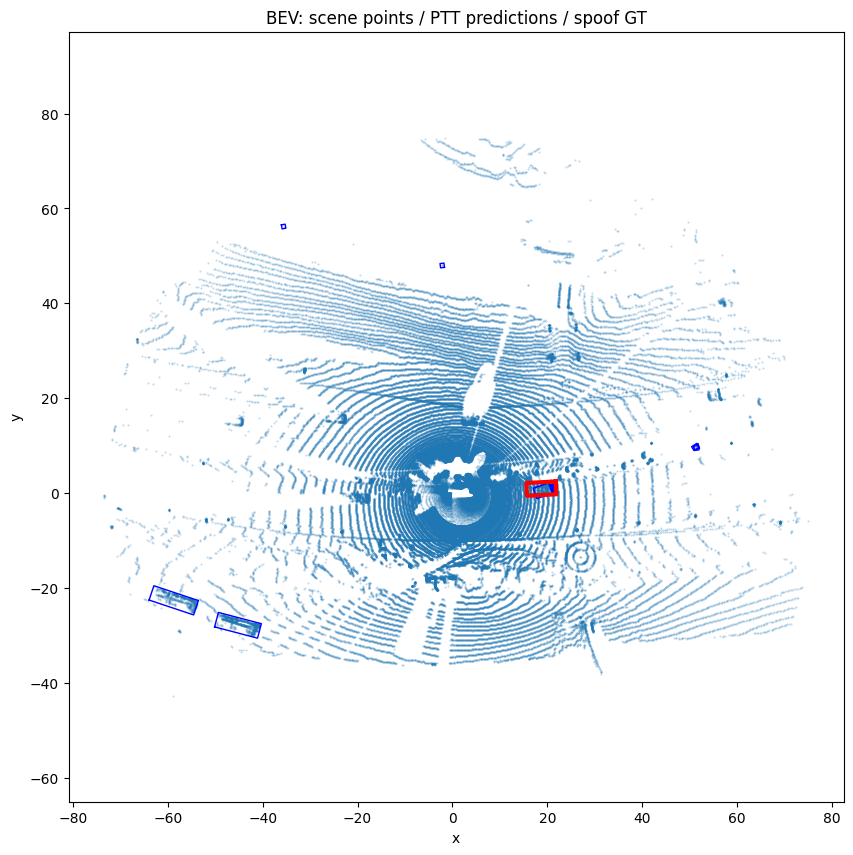

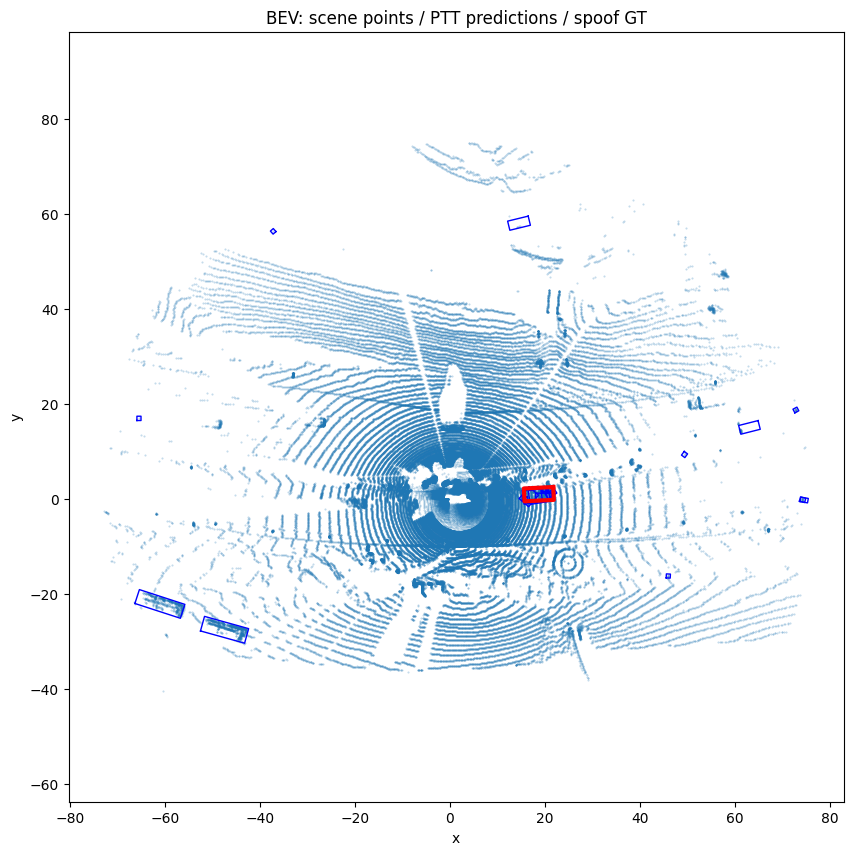

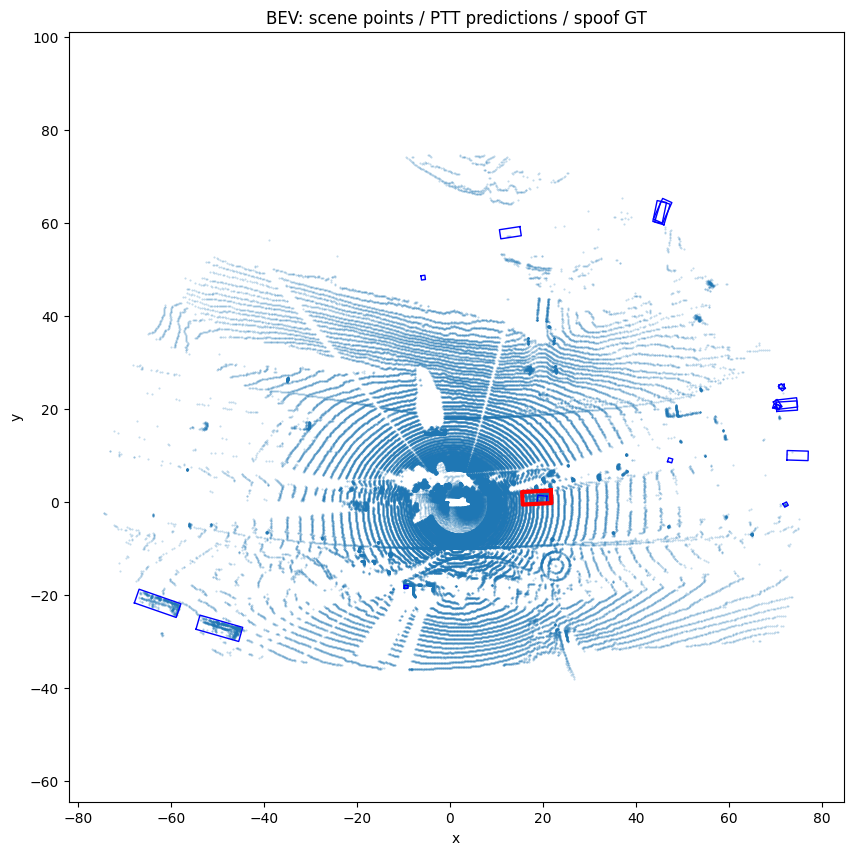

...

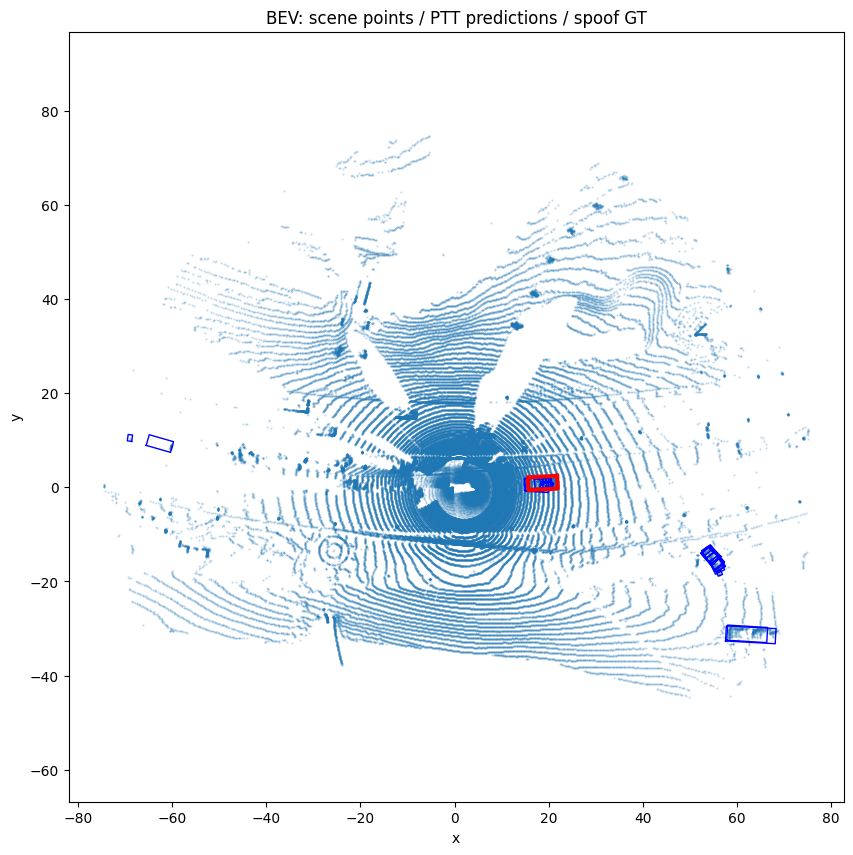

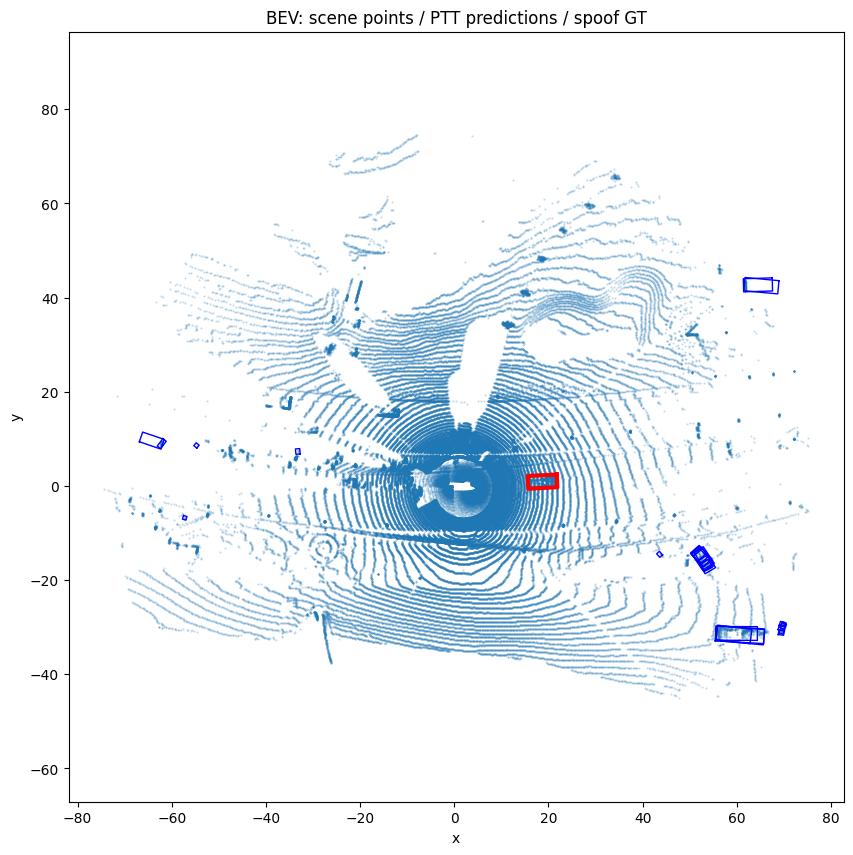

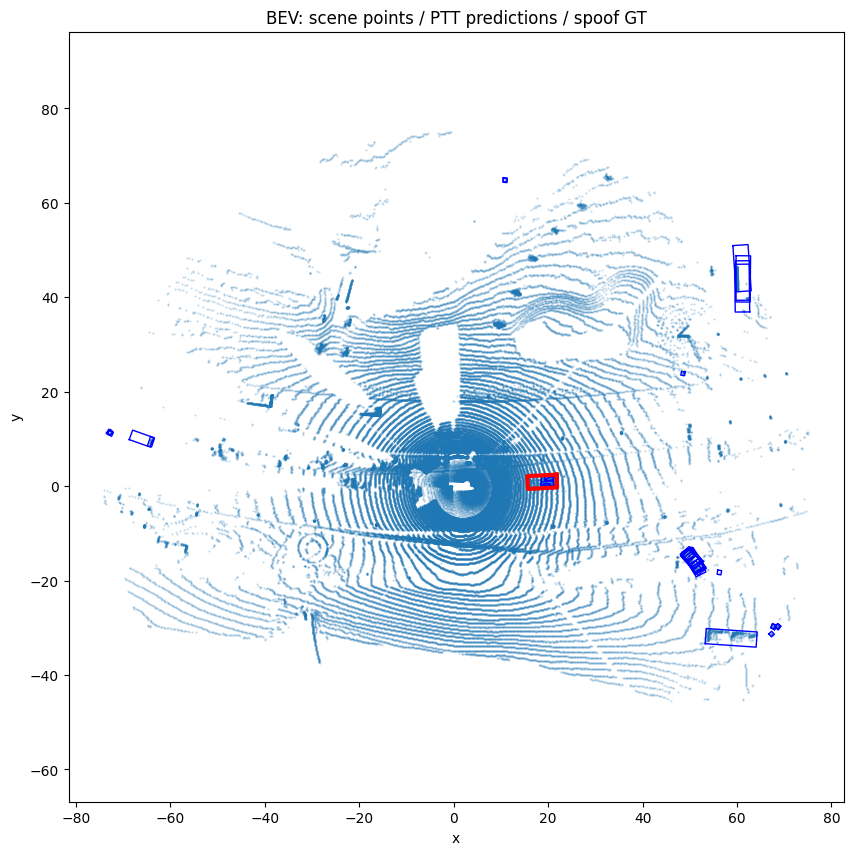

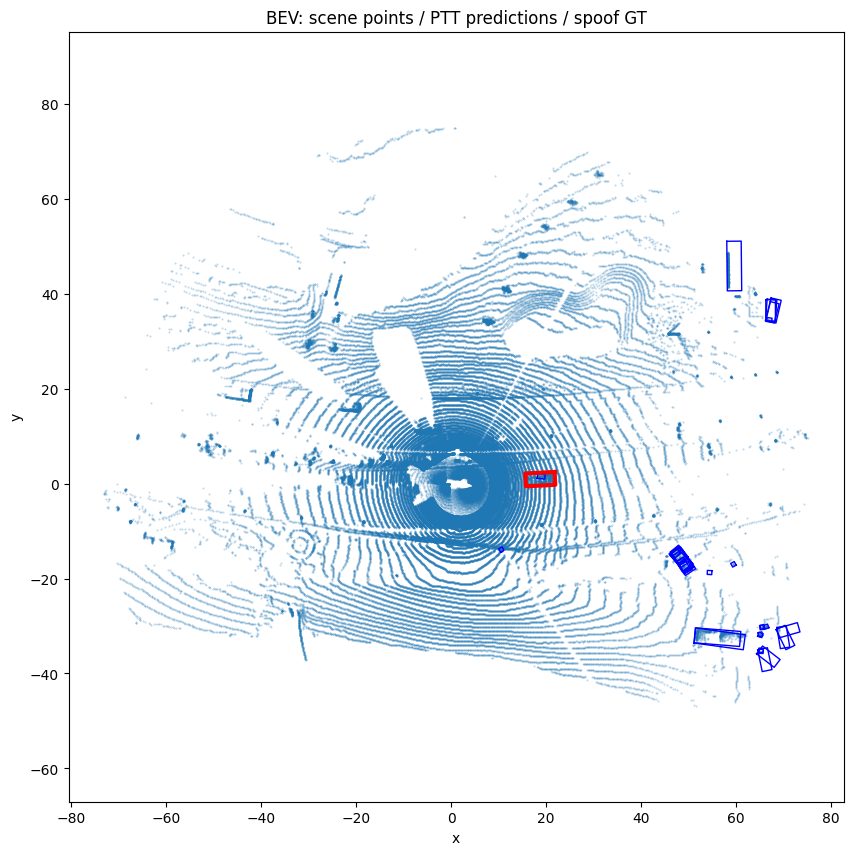

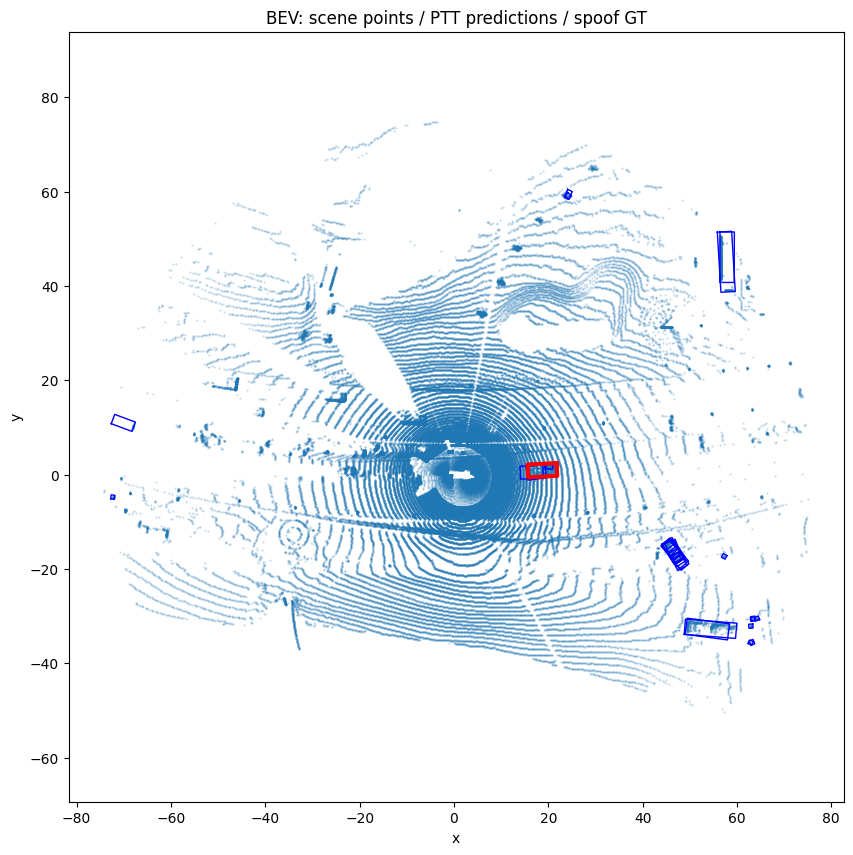

In [23]:
for j in range(32, 64):    
    # i = segment_to_global[unique_segments_sf[1]][j]
    plot_bev_ptt(
        seg_dataset[j]['points'],
        segment_preds_list[j]['boxes_lidar'],
        seg_dataset[j]['spoof_gt']
    )